# Task 6


In [1]:
import pandas as pd
import numpy as np
import nltk

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import string

ps = PorterStemmer()

stop_words = set(stopwords.words('english'))

## Read Data

In [2]:
review_url = './Hygiene/hygiene.dat'
label_url = './Hygiene/hygiene.dat.labels'
additional_url = './Hygiene/hygiene.dat.additional'

In [3]:
def read_file(url, num):
    res = []
    cnt = 0
    with open(url, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if cnt == num:
                break
            cnt+=1
            res.append(line)
    return res
train_review = read_file(review_url, 546)

In [4]:
len(train_review)

546

## Preprocessing reviews data

In [5]:
def text_preprocessing(texts):
    res = []
    for text in texts:
        cur = ''
        text = text.strip()
        if text != '':
            words = word_tokenize(text)
            for word in words:
                word = word.lower()
                if word not in stop_words and word not in string.punctuation and word[0] not in string.punctuation and word[-1] not in string.punctuation:
                        ps.stem(word)
                        cur+=word
                        cur+=' '
        res.append(cur.strip())
    return res

In [6]:
train_review_processed = text_preprocessing(train_review)

In [7]:
train_review_processed

["baguettes rolls excellent although n't tried yet excited dozen-plus types filled croissants offer ridiculously low prices 160 cheese without ham 160 blueberry without cream cheese 160 chocolate almond 160 could dangerous 160 bad bakery habit least q bakery wo n't go broke get fat 160 tried four different banh mi agree matthew basic ones somewhat americanized 160 mushroom interesting chicken bbq pork obviously 160 made good place get food in-laws seemed exotic scary 160 note self n't publish facebook in-laws might see 160 q bakery location two divided streets makes slight pain get worth stop want affordable variety used location favorite bahn mi shop seattle king baguettes saw one year pho restaurant new bahn mi joint taken residence 160 dreams king baguettes chicken bahn mi dancing head quickly rushed in.at first examination q bakery lot welcoming old king baguette 160 variety baked goods cases bahn mi regular deli sandwiches available 160 pork teriyaki chicken bahn mi found n't quit

In [8]:
train_additional = pd.read_csv(additional_url, header=None, nrows=546)
train_additional

,0,1,2,3
0,"['Vietnamese', 'Sandwiches', 'Restaurants']",98118,4,4.000000
1,"['American (New)', 'Restaurants']",98109,21,4.047619
2,"['Mexican', 'Restaurants']",98103,14,3.111111
3,"['Mexican', 'Tex-Mex', 'Restaurants']",98112,42,4.088889
4,"['Mexican', 'Restaurants']",98102,12,3.071429
...,...,...,...,...
541,"['Mexican', 'Restaurants']",98108,3,4.666667
542,"['Chinese', 'Restaurants']",98101,7,3.111111
543,"['Pizza', 'Restaurants']",98121,18,3.450000
544,"['Vietnamese', 'Sandwiches', 'Restaurants']",98105,10,4.300000


In [9]:
train_label = pd.read_csv(label_url, header=None, nrows=546)

In [10]:
train_label

,0
0,1
1,1
2,1
3,0
4,0
...,...
541,0
542,1
543,0
544,1


## Merge train_label

In [11]:
train_data = pd.DataFrame({"reviews": train_review_processed})

In [12]:
train_data["cuisine"] = train_additional[0]
train_data["location"] = train_additional[1]
train_data["review_num"] = train_additional[2]
train_data["avg_rating"] = train_additional[3]
train_data["label"] = train_label[0]

In [13]:
train_data

,reviews,cuisine,location,review_num,avg_rating,label
0,baguettes rolls excellent although n't tried y...,"['Vietnamese', 'Sandwiches', 'Restaurants']",98118,4,4.000000,1
1,live street betty 160 sister town spring break...,"['American (New)', 'Restaurants']",98109,21,4.047619,1
2,worried review place strongly think bad night ...,"['Mexican', 'Restaurants']",98103,14,3.111111,1
3,ca n't access google street view like medina y...,"['Mexican', 'Tex-Mex', 'Restaurants']",98112,42,4.088889,0
4,things like place homemade guacamole 2 varieti...,"['Mexican', 'Restaurants']",98102,12,3.071429,0
...,...,...,...,...,...,...
541,convenient take-out fast service friendly help...,"['Mexican', 'Restaurants']",98108,3,4.666667,0
542,place great food one cold days craving warm fi...,"['Chinese', 'Restaurants']",98101,7,3.111111,1
543,om nom nom best ever sure easy eat waitress so...,"['Pizza', 'Restaurants']",98121,18,3.450000,0
544,laptop camper camp eat banh mi new spot close ...,"['Vietnamese', 'Sandwiches', 'Restaurants']",98105,10,4.300000,1


## preprocessing cuisine line

In [14]:
cuisine = pd.read_csv(additional_url, header=None)
cuisine[0]
        

0              ['Vietnamese', 'Sandwiches', 'Restaurants']
1                        ['American (New)', 'Restaurants']
2                               ['Mexican', 'Restaurants']
3                    ['Mexican', 'Tex-Mex', 'Restaurants']
4                               ['Mexican', 'Restaurants']
                               ...                        
13294    ['Dim Sum', 'Cantonese', 'Chinese', 'Restauran...
13295                ['Breakfast & Brunch', 'Restaurants']
13296                        ['Vietnamese', 'Restaurants']
13297                  ['Italian', 'Pizza', 'Restaurants']
13298                        ['Sandwiches', 'Restaurants']
Name: 0, Length: 13299, dtype: object

In [15]:
def get_cuisine_list(data):
    res = []
    for idx, values in data.iterrows():
        cuisines = values[0][1:-1].split(',')
        for cuisine in cuisines:
            cuisine = cuisine.strip()
            cuisine = cuisine[1:-1]
            if cuisine not in res:
                res.append(cuisine)
    return res
cuisine_list = get_cuisine_list(cuisine)
cuisine_list

['Vietnamese',
 'Sandwiches',
 'Restaurants',
 'American (New)',
 'Mexican',
 'Tex-Mex',
 'Breakfast & Brunch',
 'French',
 'Creperies',
 'Vegetarian',
 'Ethiopian',
 'Vegan',
 'Thai',
 'Barbeque',
 'Chinese',
 'Japanese',
 'Delis',
 'Seafood',
 'Buffets',
 'Burgers',
 'Southern',
 'Asian Fusion',
 'Tapas Bars',
 'Irish',
 'Caribbean',
 'Dim Sum',
 'Cantonese',
 'Italian',
 'Cafes',
 'American (Traditional)',
 'Steakhouses',
 'Sushi Bars',
 'Modern European',
 'Fast Food',
 'Greek',
 'Pizza',
 'Cheesesteaks',
 'Szechuan',
 'Mediterranean',
 'Gluten-Free',
 'Pakistani',
 'Indian',
 'Hawaiian',
 'Soul Food',
 'Korean',
 'Moroccan',
 'Himalayan/Nepalese',
 'Food Stands',
 'Salvadoran',
 'Latin American',
 'Tapas/Small Plates',
 'Hot Dogs',
 'Live/Raw Food',
 'Hot Pot',
 'Middle Eastern',
 'African',
 'Taiwanese',
 'Halal',
 'Soup',
 'Diners',
 'Turkish',
 'Spanish',
 'Haitian',
 'Cuban',
 'Basque',
 'Russian',
 'Salad',
 'Cajun/Creole',
 'Chicken Wings',
 'Scandinavian',
 'Fish & Chips',


In [16]:
def create_cuisine_column(cuisine_list, data):
    res = []
    for comp in data[0]:
        cur = []
        for cuisine in cuisine_list:
            if cuisine in comp:
                cur.append(1)
            else:
                cur.append(0)
        res.append(cur)
    return res

train_data_cuisine_list = create_cuisine_column(cuisine_list, train_additional)
train_data_cuisine_list

[[1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [0,
  0

In [17]:
train_cuisine_pd = pd.DataFrame(train_data_cuisine_list, columns=cuisine_list)
train_cuisine_pd

,Vietnamese,Sandwiches,Restaurants,American (New),Mexican,Tex-Mex,Breakfast & Brunch,French,Creperies,Vegetarian,...,Persian/Iranian,Venezuelan,Colombian,Fondue,Polish,Senegalese,Comfort Food,Puerto Rican,Egyptian,Scottish
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
542,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
543,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
544,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# combine two pandas df based on id

In [18]:
train_dt=pd.concat([train_data, train_cuisine_pd], axis=1)
train_dt

,reviews,cuisine,location,review_num,avg_rating,label,Vietnamese,Sandwiches,Restaurants,American (New),...,Persian/Iranian,Venezuelan,Colombian,Fondue,Polish,Senegalese,Comfort Food,Puerto Rican,Egyptian,Scottish
0,baguettes rolls excellent although n't tried y...,"['Vietnamese', 'Sandwiches', 'Restaurants']",98118,4,4.000000,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,live street betty 160 sister town spring break...,"['American (New)', 'Restaurants']",98109,21,4.047619,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,worried review place strongly think bad night ...,"['Mexican', 'Restaurants']",98103,14,3.111111,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,ca n't access google street view like medina y...,"['Mexican', 'Tex-Mex', 'Restaurants']",98112,42,4.088889,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,things like place homemade guacamole 2 varieti...,"['Mexican', 'Restaurants']",98102,12,3.071429,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,convenient take-out fast service friendly help...,"['Mexican', 'Restaurants']",98108,3,4.666667,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
542,place great food one cold days craving warm fi...,"['Chinese', 'Restaurants']",98101,7,3.111111,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
543,om nom nom best ever sure easy eat waitress so...,"['Pizza', 'Restaurants']",98121,18,3.450000,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
544,laptop camper camp eat banh mi new spot close ...,"['Vietnamese', 'Sandwiches', 'Restaurants']",98105,10,4.300000,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


# get testing data

In [19]:
def read_file_s(url, start):
    res = []
    cnt = 0
    with open(url, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if cnt < start:
                cnt+=1
                continue
            res.append(line)
    return res
test_review = read_file_s(review_url, 546)
test_review

['I took a date here and we had a great time. &#160;Definitely order the lasagna. &#160;I don\'t even like lasagna and I was in heaven when I tried a bite! &#160;We ordered a half-carafe of wine and drank the entire thing somehow (it was huge) and were charged for a full carafe (oh...that explains it) but when we asked about it, the waitress ended up apologizing and comping one of our desserts. &#160;Now that\'s what I call "the customer is always right." &#160;We will definitely return.One little side note- If you\'re on a budget like I usually am, you can totally eat here on the cheap if you stick to the pasta dishes. &#160;This place doesn\'t have to break the bank. I started off with a Pink Madonna (vodka with pink lemonade-mmmm!) The specials and the menu selections were great! I ended up going with the risotto with pancetta, squash, and leeks! YUM! &#160;My friends had some of the pasta dishes- their dishes were delicious!!I was hoping to try the creme brule but they were out for

In [20]:
test_review_processed = text_preprocessing(test_review)

In [21]:
test_review_processed

["took date great time 160 definitely order lasagna 160 n't even like lasagna heaven tried bite 160 ordered half-carafe wine drank entire thing somehow huge charged full carafe oh explains asked waitress ended apologizing comping one desserts 160 call customer always right 160 definitely return.one little side budget like usually totally eat cheap stick pasta dishes 160 place n't break bank started pink madonna vodka pink lemonade-mmmm specials menu selections great ended going risotto pancetta squash leeks yum 160 friends pasta dishes delicious hoping try creme brule night decor place cozy n't look wheelchair accessible 160 band playing friends said music good 160 see place romantic setting couples since dim light evenings could n't find street parking parked parking garage pink door website suggested park place something special truly feel like dining paris circa late 19th century even entrance via alley large metal door tres chic.gorgeous atmosphere funky fun beautiful romantic seaf

In [22]:
test_additional = pd.read_csv(additional_url, header=None, skiprows=546)
test_label = pd.read_csv(label_url, header=None, skiprows=546)

In [23]:
test_additional

,0,1,2,3
0,"['Italian', 'Restaurants']",98101,13,4.142857
1,"['Fast Food', 'Mexican', 'Restaurants']",98101,1,5.000000
2,"['Moroccan', 'Restaurants']",98117,5,3.000000
3,"['Pizza', 'Restaurants']",98118,2,3.333333
4,"['American (Traditional)', 'Restaurants']",98108,15,3.600000
...,...,...,...,...
12748,"['Dim Sum', 'Cantonese', 'Chinese', 'Restauran...",98104,1,3.000000
12749,"['Breakfast & Brunch', 'Restaurants']",98116,29,4.258065
12750,"['Vietnamese', 'Restaurants']",98104,1,4.000000
12751,"['Italian', 'Pizza', 'Restaurants']",98109,2,4.000000


In [24]:
test_label

,0
0,[None]
1,[None]
2,[None]
3,[None]
4,[None]
...,...
12748,[None]
12749,[None]
12750,[None]
12751,[None]


In [25]:
test_data = pd.DataFrame({"reviews": test_review_processed})

test_data["cuisine"] = test_additional[0]
test_data["location"] = test_additional[1]
test_data["review_num"] = test_additional[2]
test_data["avg_rating"] = test_additional[3]

test_data

,reviews,cuisine,location,review_num,avg_rating
0,took date great time 160 definitely order lasa...,"['Italian', 'Restaurants']",98101,13,4.142857
1,love place ingredients always fresh staff alwa...,"['Fast Food', 'Mexican', 'Restaurants']",98101,1,5.000000
2,looking forward dinner kasbah huge fan marrake...,"['Moroccan', 'Restaurants']",98117,5,3.000000
3,love local pizza place tino pizza always super...,"['Pizza', 'Restaurants']",98118,2,3.333333
4,popped days ago take-out work ordered deluxe g...,"['American (Traditional)', 'Restaurants']",98108,15,3.600000
...,...,...,...,...,...
12748,keep dim sum dining expectations low seattle 1...,"['Dim Sum', 'Cantonese', 'Chinese', 'Restauran...",98104,1,3.000000
12749,cheap eats veggie alterna-meats perfect seattl...,"['Breakfast & Brunch', 'Restaurants']",98116,29,4.258065
12750,everything awesome except wait roommate waited...,"['Vietnamese', 'Restaurants']",98104,1,4.000000
12751,great place go queen anne everywhere else book...,"['Italian', 'Pizza', 'Restaurants']",98109,2,4.000000


In [26]:
test_data_cuisine_list = create_cuisine_column(cuisine_list, test_additional)
test_data_cuisine_list

[[0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [0,
  0,
  1,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [0,
  0

In [27]:
test_cuisine_pd = pd.DataFrame(test_data_cuisine_list, columns=cuisine_list)
test_cuisine_pd

,Vietnamese,Sandwiches,Restaurants,American (New),Mexican,Tex-Mex,Breakfast & Brunch,French,Creperies,Vegetarian,...,Persian/Iranian,Venezuelan,Colombian,Fondue,Polish,Senegalese,Comfort Food,Puerto Rican,Egyptian,Scottish
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12749,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12750,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12751,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
test_dt=pd.concat([test_data, test_cuisine_pd], axis=1)
test_dt

,reviews,cuisine,location,review_num,avg_rating,Vietnamese,Sandwiches,Restaurants,American (New),Mexican,...,Persian/Iranian,Venezuelan,Colombian,Fondue,Polish,Senegalese,Comfort Food,Puerto Rican,Egyptian,Scottish
0,took date great time 160 definitely order lasa...,"['Italian', 'Restaurants']",98101,13,4.142857,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,love place ingredients always fresh staff alwa...,"['Fast Food', 'Mexican', 'Restaurants']",98101,1,5.000000,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
2,looking forward dinner kasbah huge fan marrake...,"['Moroccan', 'Restaurants']",98117,5,3.000000,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,love local pizza place tino pizza always super...,"['Pizza', 'Restaurants']",98118,2,3.333333,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,popped days ago take-out work ordered deluxe g...,"['American (Traditional)', 'Restaurants']",98108,15,3.600000,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748,keep dim sum dining expectations low seattle 1...,"['Dim Sum', 'Cantonese', 'Chinese', 'Restauran...",98104,1,3.000000,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
12749,cheap eats veggie alterna-meats perfect seattl...,"['Breakfast & Brunch', 'Restaurants']",98116,29,4.258065,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
12750,everything awesome except wait roommate waited...,"['Vietnamese', 'Restaurants']",98104,1,4.000000,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
12751,great place go queen anne everywhere else book...,"['Italian', 'Pizza', 'Restaurants']",98109,2,4.000000,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


# Turn zip Code to feature columns

## 1. train_data

In [56]:
train_zip_dummies = pd.get_dummies(train_dt, columns=['location'], prefix='location')
train = train_zip_dummies

In [57]:
train

,reviews,cuisine,review_num,avg_rating,label,Vietnamese,Sandwiches,Restaurants,American (New),Mexican,...,location_98121,location_98122,location_98125,location_98126,location_98133,location_98134,location_98136,location_98144,location_98146,location_98199
0,baguettes rolls excellent although n't tried y...,"['Vietnamese', 'Sandwiches', 'Restaurants']",4,4.000000,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,live street betty 160 sister town spring break...,"['American (New)', 'Restaurants']",21,4.047619,1,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,worried review place strongly think bad night ...,"['Mexican', 'Restaurants']",14,3.111111,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,ca n't access google street view like medina y...,"['Mexican', 'Tex-Mex', 'Restaurants']",42,4.088889,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,things like place homemade guacamole 2 varieti...,"['Mexican', 'Restaurants']",12,3.071429,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,convenient take-out fast service friendly help...,"['Mexican', 'Restaurants']",3,4.666667,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
542,place great food one cold days craving warm fi...,"['Chinese', 'Restaurants']",7,3.111111,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
543,om nom nom best ever sure easy eat waitress so...,"['Pizza', 'Restaurants']",18,3.450000,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
544,laptop camper camp eat banh mi new spot close ...,"['Vietnamese', 'Sandwiches', 'Restaurants']",10,4.300000,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


## 2. test_data

In [58]:
test_zip_dummies = pd.get_dummies(test_dt, columns=['location'], prefix='location')
test = test_zip_dummies

In [59]:
test

,reviews,cuisine,review_num,avg_rating,Vietnamese,Sandwiches,Restaurants,American (New),Mexican,Tex-Mex,...,location_98134,location_98136,location_98144,location_98146,location_98166,location_98168,location_98177,location_98178,location_98188,location_98199
0,took date great time 160 definitely order lasa...,"['Italian', 'Restaurants']",13,4.142857,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,love place ingredients always fresh staff alwa...,"['Fast Food', 'Mexican', 'Restaurants']",1,5.000000,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,looking forward dinner kasbah huge fan marrake...,"['Moroccan', 'Restaurants']",5,3.000000,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,love local pizza place tino pizza always super...,"['Pizza', 'Restaurants']",2,3.333333,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,popped days ago take-out work ordered deluxe g...,"['American (Traditional)', 'Restaurants']",15,3.600000,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748,keep dim sum dining expectations low seattle 1...,"['Dim Sum', 'Cantonese', 'Chinese', 'Restauran...",1,3.000000,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12749,cheap eats veggie alterna-meats perfect seattl...,"['Breakfast & Brunch', 'Restaurants']",29,4.258065,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12750,everything awesome except wait roommate waited...,"['Vietnamese', 'Restaurants']",1,4.000000,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12751,great place go queen anne everywhere else book...,"['Italian', 'Pizza', 'Restaurants']",2,4.000000,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Work1: text representation techniques

## unigrams using NLTK

In [29]:
from sklearn.feature_extraction.text import CountVectorizer

In [30]:
#bigrams
bi_cv = CountVectorizer(ngram_range=[2,2])
bow = bi_cv.fit_transform(test_dt)
bi_cv.vocabulary_

{'american new': 0,
 'tex mex': 28,
 'breakfast brunch': 3,
 'asian fusion': 2,
 'tapas bars': 26,
 'dim sum': 7,
 'american traditional': 1,
 'sushi bars': 25,
 'modern european': 19,
 'fast food': 8,
 'gluten free': 12,
 'soul food': 24,
 'himalayan nepalese': 13,
 'food stands': 11,
 'latin american': 16,
 'tapas small': 27,
 'small plates': 23,
 'hot dogs': 14,
 'live raw': 17,
 'raw food': 22,
 'hot pot': 15,
 'middle eastern': 18,
 'cajun creole': 4,
 'chicken wings': 5,
 'fish chips': 9,
 'food court': 10,
 'persian iranian': 20,
 'comfort food': 6,
 'puerto rican': 21}

In [31]:
#unigram
ni_cv = CountVectorizer(ngram_range=[1,1])
bow_ti = ni_cv.fit_transform(test_dt)
ni_cv.vocabulary_

{'reviews': 90,
 'cuisine': 31,
 'location': 69,
 'review_num': 89,
 'avg_rating': 5,
 'vietnamese': 121,
 'sandwiches': 95,
 'restaurants': 88,
 'american': 2,
 'new': 79,
 'mexican': 73,
 'tex': 113,
 'mex': 72,
 'breakfast': 11,
 'brunch': 13,
 'french': 46,
 'creperies': 29,
 'vegetarian': 119,
 'ethiopian': 38,
 'vegan': 118,
 'thai': 114,
 'barbeque': 6,
 'chinese': 23,
 'japanese': 62,
 'delis': 32,
 'seafood': 98,
 'buffets': 14,
 'burgers': 15,
 'southern': 104,
 'asian': 3,
 'fusion': 47,
 'tapas': 112,
 'bars': 7,
 'irish': 60,
 'caribbean': 20,
 'dim': 33,
 'sum': 108,
 'cantonese': 19,
 'italian': 61,
 'cafes': 16,
 'traditional': 115,
 'steakhouses': 107,
 'sushi': 109,
 'modern': 75,
 'european': 39,
 'fast': 40,
 'food': 44,
 'greek': 51,
 'pizza': 82,
 'cheesesteaks': 21,
 'szechuan': 110,
 'mediterranean': 71,
 'gluten': 50,
 'free': 45,
 'pakistani': 80,
 'indian': 57,
 'hawaiian': 54,
 'soul': 102,
 'korean': 63,
 'moroccan': 77,
 'himalayan': 55,
 'nepalese': 78,
 

# Work2: learning algorithms with additiona features

- LogisticRegression
- SVC
- GaussianNB
- KNeighborsClassifier
- DecisionTreeClassifier
- RandomForestClassifier

- XGBClassifier

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.metrics  import f1_score,accuracy_score
from sklearn.model_selection import train_test_split 

In [62]:
Y = train['label']
X = train[train.columns.difference(["reviews", "cuisine", "label"])]

In [65]:
X

,Afghan,African,American (New),American (Traditional),Asian Fusion,Australian,Barbeque,Basque,Belgian,Brazilian,...,location_98122,location_98125,location_98126,location_98133,location_98134,location_98136,location_98144,location_98146,location_98199,review_num
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,21
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,14
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,42
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
542,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7
543,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,18
544,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10


In [66]:
test_x = test[test.columns.difference(["reviews", "cuisine", "label"])]

In [67]:
test_x

,Afghan,African,American (New),American (Traditional),Asian Fusion,Australian,Barbeque,Basque,Belgian,Brazilian,...,location_98136,location_98144,location_98146,location_98166,location_98168,location_98177,location_98178,location_98188,location_98199,review_num
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,13
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12749,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,29
12750,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12751,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2


# LogisticRegression

In [68]:
log_reg = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=20)
log_reg.fit(x_train, y_train)
log_pred=log_reg.predict(x_test)

D:\Anaconda3\envs\Kaggle\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [87]:
# print(log_reg.coef_)

In [70]:

print(accuracy_score(y_test,log_pred))
print(f1_score(y_test,log_pred))

0.6058394160583942
0.5645161290322579



## Random_state = 20, test_size=0.25
## f1 score = 0.65

In [71]:
random_lists = [2, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150, 200]

def get_f1_score(x, y, random_lo, random_hi, func):
    random_li = []
    res = []
    for random in range(random_lo, random_hi, 5):
        random_li.append(random)
        log_reg = func
        x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=random)
        log_reg.fit(x_train, y_train)
        log_pred=log_reg.predict(x_test)
        res.append(f1_score(y_test,log_pred))
    return random_li, res

random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, LogisticRegression())
random_lists, log_reg_f1

D:\Anaconda3\envs\Kaggle\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
D:\Anaconda3\envs\Kaggle\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.656934306569343,
  0.6015037593984962,
  0.6299212598425197,
  0.5645161290322579,
  0.5625,
  0.6394557823129252,
  0.5957446808510638,
  0.5714285714285714,
  0.6474820143884893,
  0.5692307692307693,
  0.6293706293706294,
  0.6524822695035462,
  0.6277372262773723,
  0.5873015873015873,
  0.6153846153846154,
  0.5522388059701493,
  0.6527777777777778,
  0.6074074074074073,
  0.5511811023622047])

In [89]:
def get_f1_score_size(x, y, func, ran_size):
    random_li = []
    res = []
    for random in range(5, 95, 5):
        random/=100
        random_li.append(random)
        log_reg = func
        x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=random, random_state=ran_size)
        log_reg.fit(x_train, y_train)
        log_pred=log_reg.predict(x_test)
        res.append(f1_score(y_test,log_pred))
    return random_li, res

size_lists, log_reg_f1 = get_f1_score_size(X, Y, LogisticRegression(), 30)
size_lists, log_reg_f1

D:\Anaconda3\envs\Kaggle\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
D:\Anaconda3\envs\Kaggle\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.46153846153846156,
  0.5806451612903225,
  0.5517241379310346,
  0.596774193548387,
  0.6394557823129252,
  0.6136363636363636,
  0.5743589743589743,
  0.5919282511210763,
  0.6129032258064516,
  0.6080586080586081,
  0.6174496644295302,
  0.6234567901234568,
  0.6406685236768803,
  0.6318407960199004,
  0.625615763546798,
  0.6255707762557077,
  0.6302521008403361,
  0.6341463414634145])

# SVC

In [73]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, SVC())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.6621621621621623,
  0.5972222222222221,
  0.5255474452554744,
  0.6029411764705882,
  0.515625,
  0.5777777777777778,
  0.5774647887323943,
  0.6351351351351352,
  0.6330935251798561,
  0.5714285714285713,
  0.5850340136054422,
  0.5970149253731344,
  0.6043165467625898,
  0.5669291338582678,
  0.4724409448818898,
  0.5669291338582677,
  0.6417910447761194,
  0.5942028985507247,
  0.5547445255474452])

In [90]:
svc_random_lists, svc_f1 = get_f1_score_size(X, Y, SVC(), 30)
svc_random_lists, svc_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.5714285714285715,
  0.6181818181818183,
  0.5822784810126583,
  0.5523809523809524,
  0.5777777777777778,
  0.5660377358490567,
  0.5303867403314917,
  0.5402843601895734,
  0.5067873303167421,
  0.5119999999999999,
  0.5251798561151079,
  0.5298013245033112,
  0.5349544072948328,
  0.546448087431694,
  0.5440414507772021,
  0.5141388174807197,
  0.567099567099567,
  0.5315904139433552])

# Gaussian

In [75]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, GaussianNB())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.7126436781609196,
  0.5786163522012578,
  0.15584415584415587,
  0.6586826347305389,
  0.6555555555555556,
  0.6257668711656441,
  0.5696969696969697,
  0.4821428571428572,
  0.0975609756097561,
  0.4615384615384615,
  0.6482758620689655,
  0.5714285714285714,
  0.6315789473684211,
  0.6419753086419754,
  0.4905660377358491,
  0.5975609756097561,
  0.32989690721649484,
  0.5217391304347826,
  0.6878980891719746])

In [91]:
gaussian_size_lists, gaussian_f1 = get_f1_score_size(X, Y, GaussianNB(), 30)
gaussian_size_lists, gaussian_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.13333333333333336,
  0.608695652173913,
  0.5208333333333334,
  0.64,
  0.6257668711656441,
  0.5934065934065933,
  0.5876777251184834,
  0.6259541984732825,
  0.6540880503144655,
  0.627906976744186,
  0.6683168316831682,
  0.6742081447963802,
  0.679324894514768,
  0.664,
  0.6396588486140725,
  0.4947916666666667,
  0.4502617801047121,
  0.5507900677200903])

# KNeighborsClassifier

In [77]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, KNeighborsClassifier())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.6482758620689655,
  0.5230769230769231,
  0.4878048780487805,
  0.564885496183206,
  0.5413533834586466,
  0.593103448275862,
  0.5909090909090909,
  0.5625,
  0.6176470588235294,
  0.5522388059701493,
  0.5671641791044775,
  0.5937500000000001,
  0.5909090909090908,
  0.532258064516129,
  0.5874125874125874,
  0.5815602836879433,
  0.5454545454545455,
  0.6056338028169014,
  0.4925373134328358])

In [92]:
knn_size_lists, knn_f1 = get_f1_score_size(X, Y, KNeighborsClassifier(), 30)
knn_size_lists, knn_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.7142857142857142,
  0.71875,
  0.6136363636363636,
  0.6280991735537191,
  0.593103448275862,
  0.562874251497006,
  0.5549738219895289,
  0.5248868778280543,
  0.5542168674698795,
  0.5765124555160143,
  0.5667752442996742,
  0.5438066465256798,
  0.5706521739130436,
  0.5540897097625331,
  0.5625,
  0.5829596412556054,
  0.5657015590200445,
  0.49576271186440685])

DecisionTreeClassifier

RandomForestClassifier

XGBClassifier

# DecisionTreeClassifier

In [79]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, DecisionTreeClassifier())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.6490066225165563,
  0.5531914893617023,
  0.4576271186440678,
  0.578125,
  0.6176470588235293,
  0.631578947368421,
  0.5352112676056338,
  0.5942028985507246,
  0.619718309859155,
  0.5864661654135339,
  0.593103448275862,
  0.6618705035971223,
  0.5151515151515152,
  0.549618320610687,
  0.5751633986928105,
  0.5074626865671641,
  0.5874125874125875,
  0.5757575757575757,
  0.589041095890411])

In [93]:
dt_size_lists, dt_f1 = get_f1_score_size(X, Y, DecisionTreeClassifier(), 30)
dt_size_lists, dt_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.5384615384615384,
  0.6875,
  0.574712643678161,
  0.591304347826087,
  0.6225165562913908,
  0.625,
  0.594059405940594,
  0.5714285714285715,
  0.5779467680608366,
  0.5806451612903226,
  0.5870307167235496,
  0.6017699115044248,
  0.5983379501385042,
  0.6060606060606061,
  0.575609756097561,
  0.5758928571428571,
  0.5788423153692615,
  0.5993265993265993])

# RandomForestClassifier

In [81]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, RandomForestClassifier())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.6619718309859155,
  0.6478873239436619,
  0.4821428571428571,
  0.6129032258064515,
  0.6363636363636364,
  0.6619718309859155,
  0.6456692913385826,
  0.6029411764705882,
  0.5806451612903226,
  0.6356589147286821,
  0.6068965517241379,
  0.6131386861313869,
  0.6142857142857143,
  0.5806451612903225,
  0.6323529411764707,
  0.562962962962963,
  0.6131386861313869,
  0.5736434108527132,
  0.5652173913043478])

In [94]:
rf_size_lists, rf_f1 = get_f1_score_size(X, Y, RandomForestClassifier(), 30)
rf_size_lists, rf_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.6428571428571429,
  0.6984126984126984,
  0.5925925925925927,
  0.6194690265486725,
  0.6086956521739131,
  0.6227544910179641,
  0.572972972972973,
  0.5607476635514018,
  0.5606694560669456,
  0.5615384615384615,
  0.5986394557823129,
  0.6075949367088607,
  0.6180758017492711,
  0.6275510204081632,
  0.6180904522613064,
  0.6104783599088838,
  0.6332665330661322,
  0.6319569120287253])

# XGBClassifier

In [83]:
random_lists, log_reg_f1 = get_f1_score(X, Y, 5, 100, XGBClassifier())
random_lists, log_reg_f1

([5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95],
 [0.6620689655172414,
  0.5942028985507246,
  0.46017699115044247,
  0.5806451612903225,
  0.556390977443609,
  0.6578947368421053,
  0.6212121212121213,
  0.60431654676259,
  0.5606060606060606,
  0.5714285714285713,
  0.5714285714285713,
  0.6285714285714286,
  0.5899280575539569,
  0.5691056910569106,
  0.5970149253731343,
  0.5468749999999999,
  0.5671641791044776,
  0.5839416058394161,
  0.5413533834586466])

In [95]:
XGB_size_lists, XGB_f1 = get_f1_score_size(X, Y, XGBClassifier(), 30)
XGB_size_lists, XGB_f1

([0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9],
 [0.6428571428571429,
  0.6666666666666666,
  0.5882352941176471,
  0.6290322580645161,
  0.6578947368421053,
  0.5955056179775281,
  0.5858585858585857,
  0.5575221238938053,
  0.5634920634920635,
  0.5527272727272727,
  0.5986842105263158,
  0.6198830409356726,
  0.6324324324324325,
  0.5974025974025974,
  0.6198547215496368,
  0.6230936819172114,
  0.583170254403131,
  0.6017391304347827])

# Visualization


In [100]:
import matplotlib.pyplot as plt

In [104]:
x = [i/100 for i in range(5, 95, 5)]
x

[0.05,
 0.1,
 0.15,
 0.2,
 0.25,
 0.3,
 0.35,
 0.4,
 0.45,
 0.5,
 0.55,
 0.6,
 0.65,
 0.7,
 0.75,
 0.8,
 0.85,
 0.9]

In [ ]:
# LogisticRegression

# SVC

# GaussianNB

# KNeighborsClassifier

# DecisionTreeClassifier

# RandomForestClassifier

# XGBClassifier

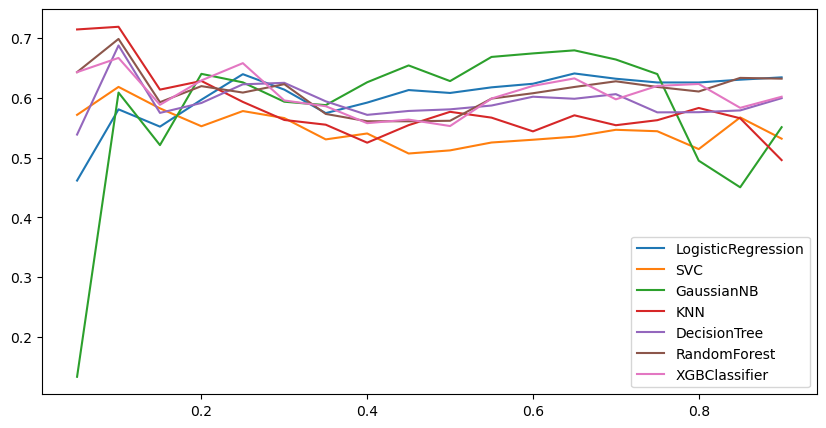

In [111]:
plt.figure(figsize=(10,5)) 
plt.plot(x, log_reg_f1, label="LogisticRegression")
plt.plot(x, svc_f1, label="SVC")
plt.plot(x, gaussian_f1, label="GaussianNB")
plt.plot(x, knn_f1, label="KNN")
plt.plot(x, dt_f1, label="DecisionTree")
plt.plot(x, rf_f1, label="RandomForest")
plt.plot(x, XGB_f1, label="XGBClassifier")

plt.legend()
plt.show()